In [1]:
!git clone https://github.com/mociatto/AT-SPGD.git

Cloning into 'AT-SPGD'...
remote: Enumerating objects: 414, done.
remote: Counting objects: 100% (96/96), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 414 (delta 43), reused 70 (delta 26), pack-reused 318 (from 1)
Receiving objects: 100% (414/414), 141.43 KiB | 1.89 MiB/s, done.
Resolving deltas: 100% (210/210), done.


In [2]:
%cd AT-SPGD

/kaggle/working/AT-SPGD


In [3]:
!pip install -q matplotlib

In [4]:
from __future__ import annotations

In [5]:
import io
import sys
from pathlib import Path
from typing import Optional, Tuple

PROJECT_ROOT = Path.cwd()
if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision.transforms.functional as TF
from IPython.display import Image as IPythonImage
from IPython.display import display
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.figure import Figure
from PIL import Image

from src.attacks.at_spgd import ATSPGD
from src.data.datasets import IMAGENET_MEAN, IMAGENET_STD, get_dataloaders
from src.models.split_models import EMB_DIM, FullVFLModel, ImageClient, VFLServer
from src.visualization.plots import (
    GAUSSIAN_BLUR_CONFIG,
    GRADCAM_CONTOUR_CONFIG,
    JPEG_COMPRESSION_CONFIG,
    MAGNIFIED_NOISE_CONFIG,
    PARETO_FRONTIER_CONFIG,
    RADIAL_ENERGY_CONFIG,
    plot_average_radial_energy_comparison,
    plot_average_radial_energy_panel,
    plot_gaussian_blur_comparison,
    plot_jpeg_compression_comparison,
    plot_jpeg_compression_panel,
    plot_noise_gradcam_sample,
    plot_pareto_frontier_comparison,
    plot_pareto_frontier_panel,
)

WORK_DIR = Path.cwd()
SEARCH_ROOTS = [WORK_DIR, Path("/kaggle/input")]


def resolve_artifact_directory(local_directory: Path, filename_pattern: str) -> Path:
    if local_directory.exists() and any(local_directory.glob(filename_pattern)):
        return local_directory

    for root in SEARCH_ROOTS:
        if not root.exists():
            continue
        match = next(root.rglob(filename_pattern), None)
        if match is not None:
            return match.parent

    raise FileNotFoundError(
        f"Unable to locate files matching {filename_pattern!r}. "
        "Attach Notebook 1 checkpoints and Notebook 2 tensor artifacts as inputs."
    )

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CHECKPOINT_DIR = resolve_artifact_directory(WORK_DIR / "checkpoints", "01_baseline_*.pth")
ARTIFACT_DIR = resolve_artifact_directory(WORK_DIR / "results" / "tensors", "02_artifacts_*.pt")
FIGURE_DIR = WORK_DIR / "results" / "figures"
CSV_DIR = WORK_DIR / "results" / "csv"
MULTIPAGE_PDF = FIGURE_DIR / "03_all_plots.pdf"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)
CSV_DIR.mkdir(parents=True, exist_ok=True)
pdf_export = PdfPages(MULTIPAGE_PDF)

In [7]:
def _denormalize(images: torch.Tensor) -> torch.Tensor:
    if float(images.min()) >= 0.0 and float(images.max()) <= 1.0:
        return images.clamp(0.0, 1.0)
    mean = torch.tensor(IMAGENET_MEAN, dtype=images.dtype, device=images.device).view(1, 3, 1, 1)
    std = torch.tensor(IMAGENET_STD, dtype=images.dtype, device=images.device).view(1, 3, 1, 1)
    return (images * std + mean).clamp(0.0, 1.0)


def load_checkpoint(path: Path) -> dict:
    try:
        return torch.load(path, map_location="cpu", weights_only=False)
    except TypeError:
        return torch.load(path, map_location="cpu")


def build_vfl_model(dataset_name: str, model_name: str) -> FullVFLModel:
    checkpoint = load_checkpoint(CHECKPOINT_DIR / f"01_baseline_{dataset_name}_{model_name}.pth")
    num_classes = int(checkpoint["num_classes"])
    client = ImageClient(model_name=model_name, dim=EMB_DIM)
    server = VFLServer(emb_dim=EMB_DIM, num_classes=num_classes)
    client.load_state_dict(checkpoint["image_client"])
    server.load_state_dict(checkpoint["vfl_server"])
    return FullVFLModel(client, server, normalize_inputs=True).eval().to(device)


@torch.no_grad()
def get_clean_batch(dataset_name: str, num_samples: int) -> Tuple[torch.Tensor, torch.Tensor]:
    _, test_loader, _ = get_dataloaders(dataset_name=dataset_name, batch_size=num_samples, num_workers=2)
    images, labels = next(iter(test_loader))
    return _denormalize(images[:num_samples]), labels[:num_samples]


def load_saved_artifacts(dataset_name: str, model_name: str, num_samples: Optional[int] = None) -> dict:
    artifact_path = ARTIFACT_DIR / f"02_artifacts_{dataset_name}_{model_name}.pt"
    try:
        artifact = torch.load(artifact_path, map_location="cpu", weights_only=False)
    except TypeError:
        artifact = torch.load(artifact_path, map_location="cpu")

    vis_dict = {
        "clean_images": artifact.get("clean_images", artifact.get("clean")),
        "labels": artifact["labels"],
    }
    if vis_dict["clean_images"] is None:
        raise KeyError(f"No clean image tensor found in {artifact_path}.")

    for key, value in artifact.items():
        if key in {"clean", "clean_images", "labels"}:
            continue
        tensor_key = key if key.startswith("adv_") else f"adv_{key}"
        vis_dict[tensor_key] = value

    if num_samples is not None:
        vis_dict = {
            key: value[:num_samples] if isinstance(value, torch.Tensor) and value.size(0) >= num_samples else value
            for key, value in vis_dict.items()
        }

    return vis_dict


def display_preview(fig: Figure, config: dict) -> None:
    preview_buffer = io.BytesIO()
    fig.savefig(preview_buffer, format="png", bbox_inches="tight", dpi=config.get("figure_dpi", 100))
    preview_buffer.seek(0)
    display(IPythonImage(data=preview_buffer.getvalue(), width=config.get("display_width_px", 800)))


def export_page(fig: Figure) -> None:
    pdf_export.savefig(fig, bbox_inches="tight")

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 155MB/s]


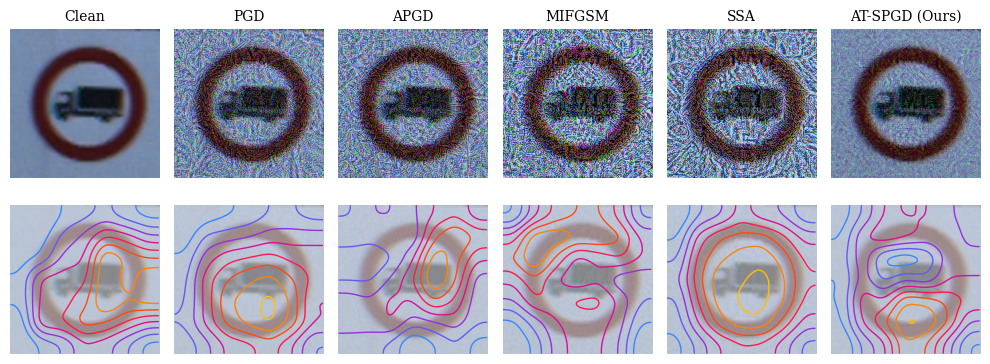

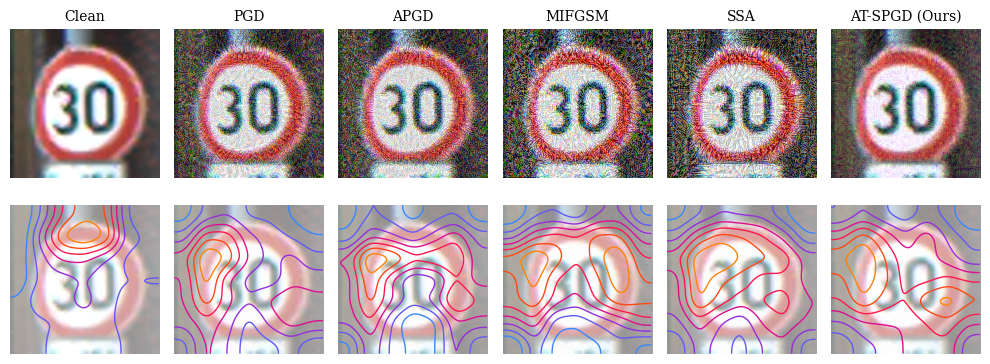

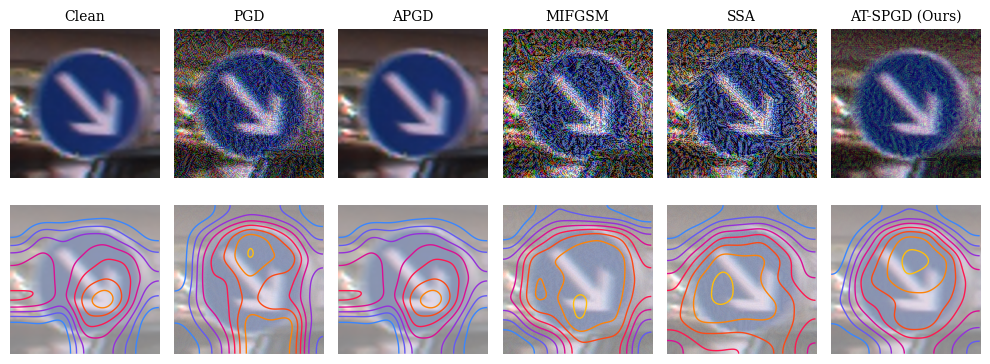

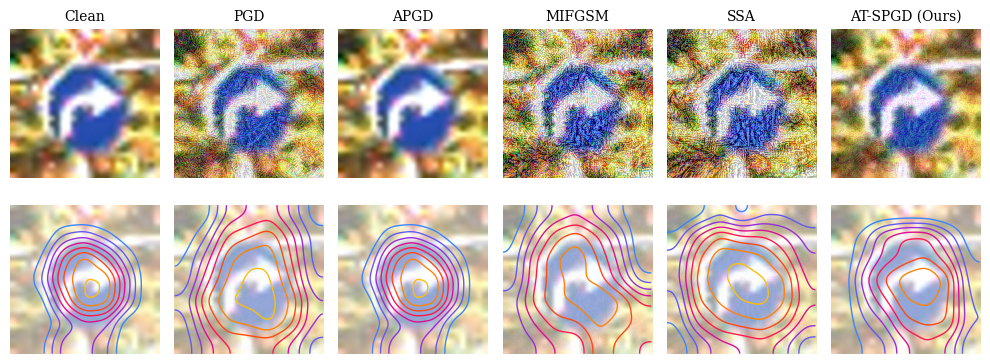

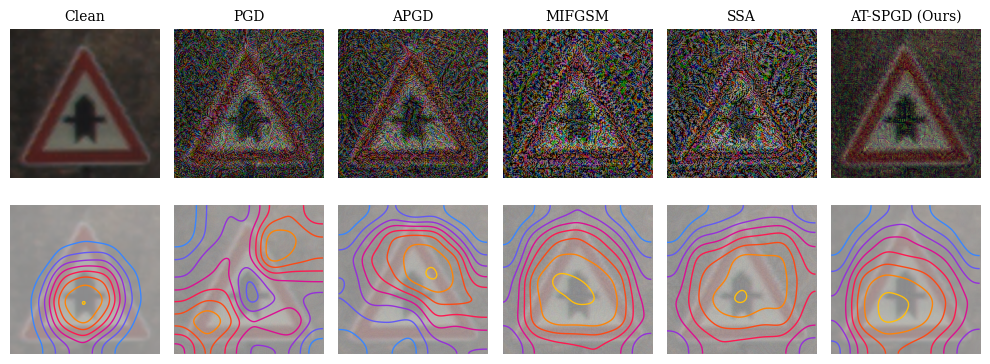

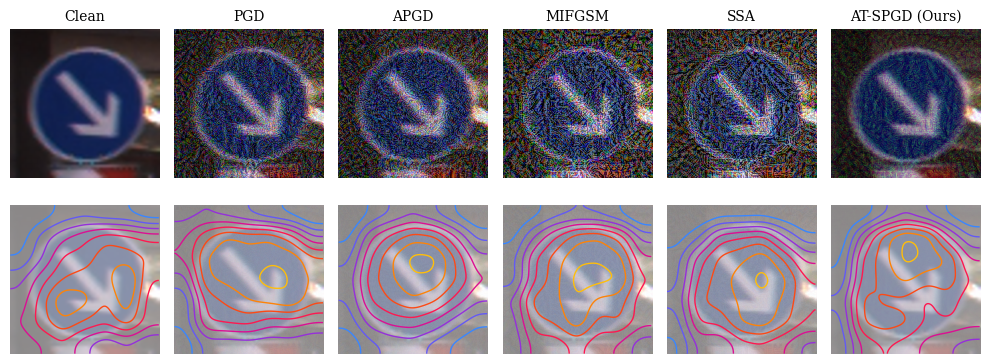

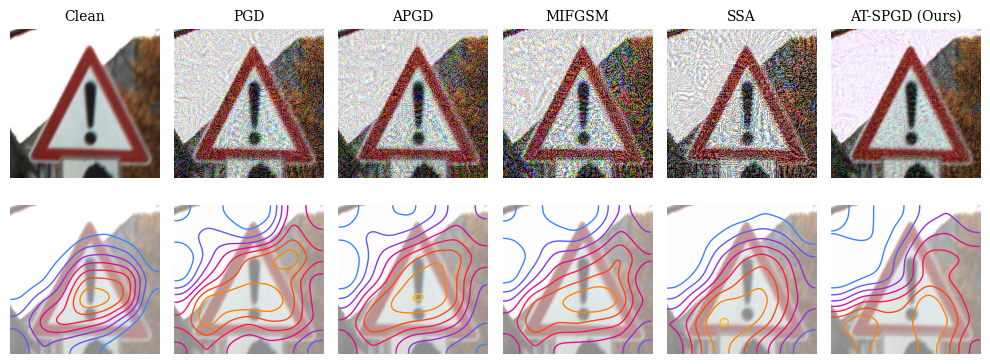

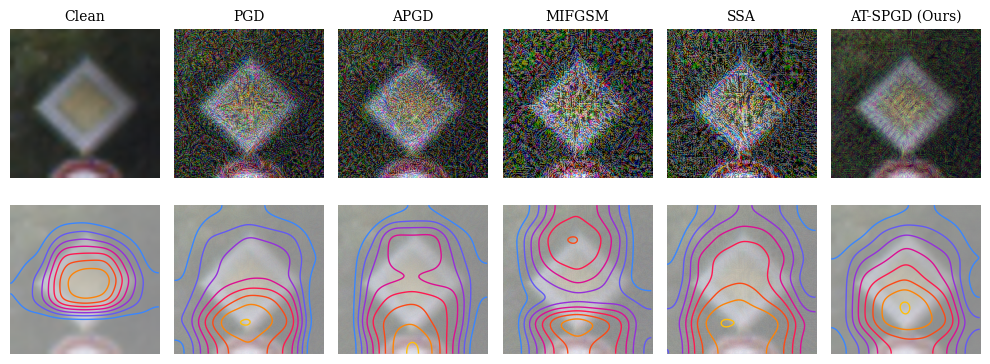

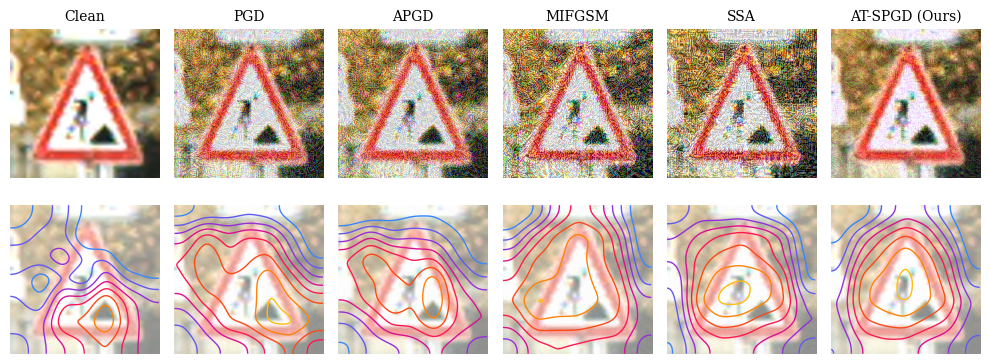

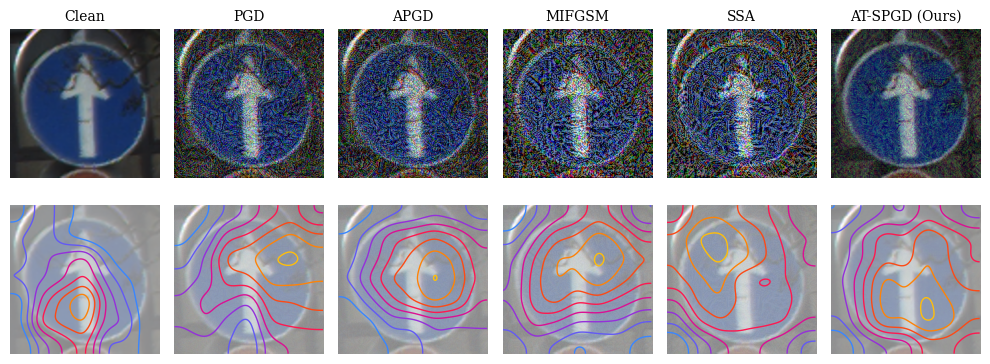

In [8]:
VIS_DATASET = "gtsrb"
VIS_MODEL = "mobilenet_v2"
NUM_VIS_SAMPLES = int(MAGNIFIED_NOISE_CONFIG.get("num_samples", 5))

vis_dict = load_saved_artifacts(VIS_DATASET, VIS_MODEL, num_samples=NUM_VIS_SAMPLES)
full_model = build_vfl_model(VIS_DATASET, VIS_MODEL)

for i in range(NUM_VIS_SAMPLES):
    fig_sample = plot_noise_gradcam_sample(full_model, VIS_MODEL, vis_dict, sample_idx=i)
    export_page(fig_sample)
    display_preview(fig_sample, MAGNIFIED_NOISE_CONFIG)
    plt.close(fig_sample)

del full_model
if torch.cuda.is_available():
    torch.cuda.empty_cache()

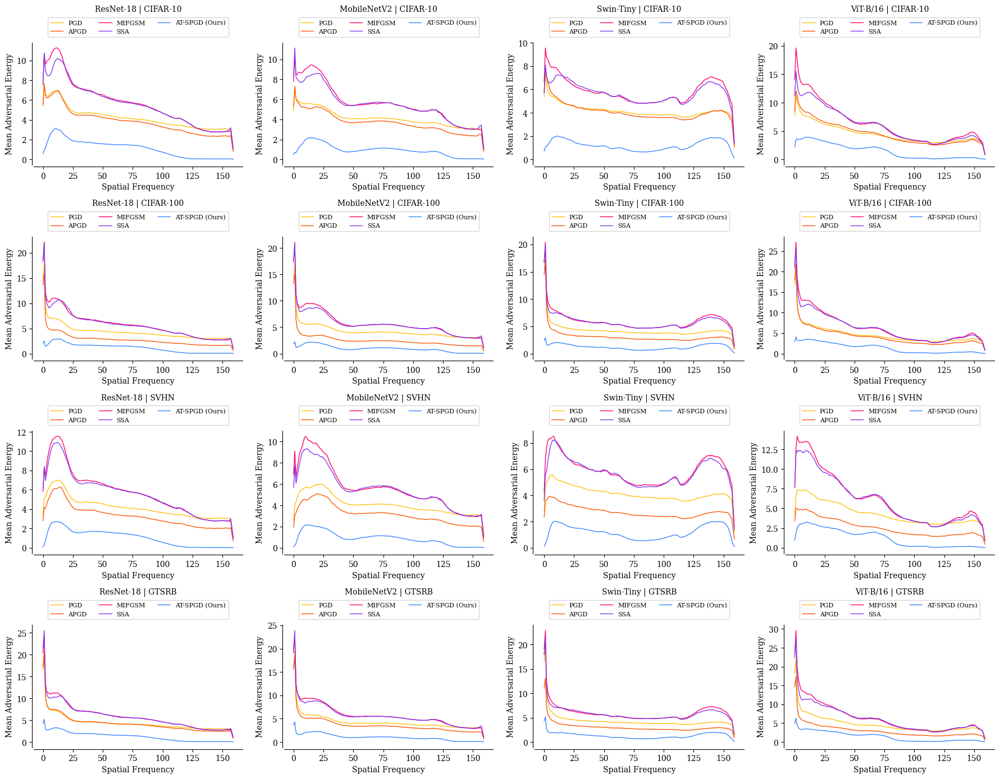

In [9]:
ENERGY_DATASETS = RADIAL_ENERGY_CONFIG["datasets"]
ENERGY_MODEL_SEQUENCE = RADIAL_ENERGY_CONFIG["model_sequence"]
ENERGY_MODEL_LABELS = RADIAL_ENERGY_CONFIG["model_labels"]
ENERGY_DATASET_LABELS = RADIAL_ENERGY_CONFIG["dataset_labels"]
ENERGY_SAMPLES = int(RADIAL_ENERGY_CONFIG.get("samples_per_case", 16))


def radial_panel_label(dataset_name: str, model_name: str) -> str:
    model_label = ENERGY_MODEL_LABELS.get(model_name, model_name)
    dataset_label = ENERGY_DATASET_LABELS.get(dataset_name, dataset_name.upper())
    return f"{model_label} | {dataset_label}"


radial_panel_artifacts: dict[str, list[dict]] = {}
for dataset_name in ENERGY_DATASETS:
    for model_name in ENERGY_MODEL_SEQUENCE:
        radial_panel_artifacts[radial_panel_label(dataset_name, model_name)] = [
            load_saved_artifacts(dataset_name, model_name, num_samples=ENERGY_SAMPLES)
        ]

fig_energy = plot_average_radial_energy_comparison(radial_panel_artifacts)
export_page(fig_energy)
display_preview(fig_energy, RADIAL_ENERGY_CONFIG)
plt.close(fig_energy)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 211MB/s]
100%|██████████| 170M/170M [01:11<00:00, 2.38MB/s]


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

100%|██████████| 169M/169M [03:38<00:00, 774kB/s]
100%|██████████| 182M/182M [00:16<00:00, 11.0MB/s]
100%|██████████| 64.3M/64.3M [00:12<00:00, 4.95MB/s]
100%|██████████| 187M/187M [00:18<00:00, 10.3MB/s]
100%|██████████| 89.0M/89.0M [00:08<00:00, 11.1MB/s]
100%|██████████| 99.6k/99.6k [00:00<00:00, 148kB/s]


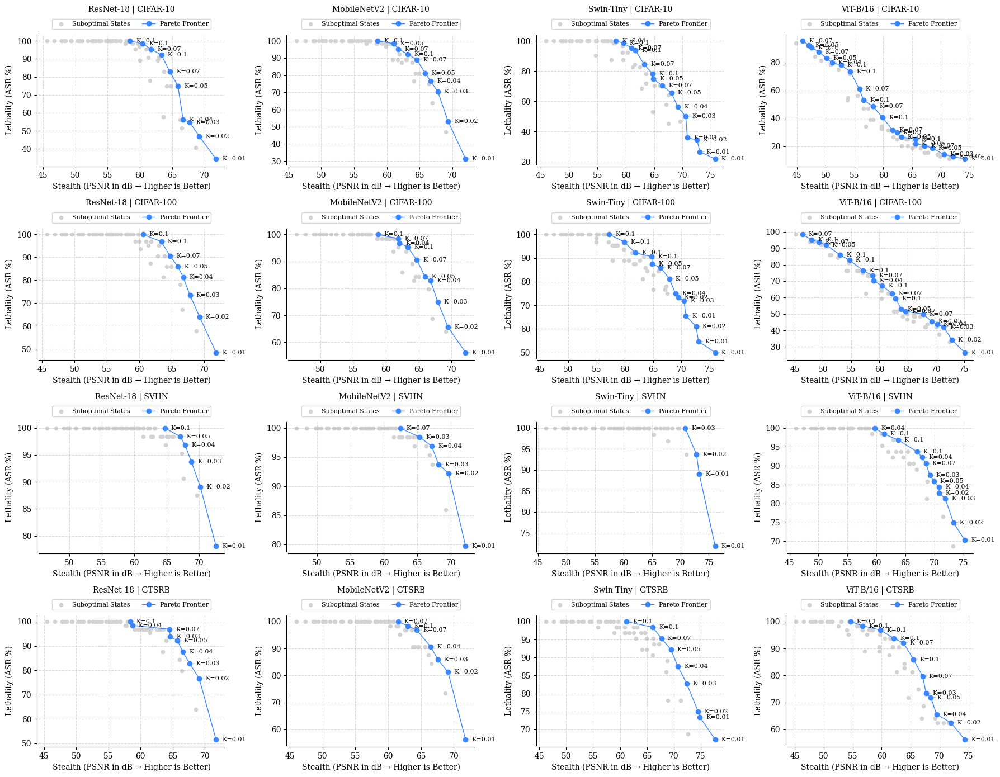

In [10]:
PARETO_SAMPLES = 64
PARETO_DATASETS = PARETO_FRONTIER_CONFIG["datasets"]
PARETO_MODEL_SEQUENCE = PARETO_FRONTIER_CONFIG["model_sequence"]
PARETO_MODEL_LABELS = PARETO_FRONTIER_CONFIG["model_labels"]
PARETO_DATASET_LABELS = PARETO_FRONTIER_CONFIG["dataset_labels"]


def pareto_panel_label(dataset_name: str, model_name: str) -> str:
    model_label = PARETO_MODEL_LABELS.get(model_name, model_name)
    dataset_label = PARETO_DATASET_LABELS.get(dataset_name, dataset_name.upper())
    return f"{model_label} | {dataset_label}"


def run_pareto_sweep(dataset_name: str, model_name: str) -> list[dict]:
    model = build_vfl_model(dataset_name, model_name)
    images, labels = get_clean_batch(dataset_name, PARETO_SAMPLES)
    images, labels = images.to(device), labels.to(device)

    results = []
    epsilon = float(PARETO_FRONTIER_CONFIG["epsilon"])
    for k in PARETO_FRONTIER_CONFIG["k_ratios"]:
        for alpha_multiplier in PARETO_FRONTIER_CONFIG["alpha_multipliers"]:
            for steps in PARETO_FRONTIER_CONFIG["steps_sweep"]:
                attack = ATSPGD(
                    model=model,
                    eps=epsilon,
                    alpha_f=(epsilon / steps) * alpha_multiplier,
                    steps=steps,
                    K=k,
                ).eval()
                adversarial = attack(images, labels)

                with torch.no_grad():
                    logits = model(adversarial)
                    asr = (logits.argmax(dim=1) != labels).float().mean().item() * 100.0
                    mse = torch.mean((adversarial - images) ** 2, dim=[1, 2, 3])
                    psnr = (20 * torch.log10(1.0 / torch.sqrt(mse))).mean().item()

                results.append({"k": k, "alpha": alpha_multiplier, "steps": steps, "asr": asr, "psnr": psnr})
                del attack, adversarial, logits

    del model, images, labels
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return results


pareto_panel_results: dict[str, list[dict]] = {}
for dataset_name in PARETO_DATASETS:
    for model_name in PARETO_MODEL_SEQUENCE:
        pareto_panel_results[pareto_panel_label(dataset_name, model_name)] = run_pareto_sweep(
            dataset_name,
            model_name,
        )

fig_pareto = plot_pareto_frontier_comparison(pareto_panel_results)
export_page(fig_pareto)
display_preview(fig_pareto, PARETO_FRONTIER_CONFIG)
plt.close(fig_pareto)

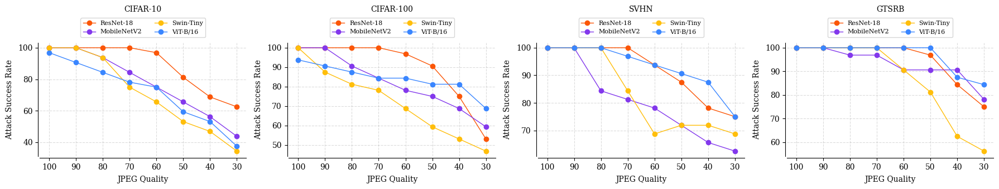

In [11]:
JPEG_DATASETS = JPEG_COMPRESSION_CONFIG["datasets"]
JPEG_MODELS = JPEG_COMPRESSION_CONFIG["models"]
JPEG_QUALITIES = JPEG_COMPRESSION_CONFIG["jpeg_qualities"]


def apply_jpeg_batch(images: torch.Tensor, quality: int) -> torch.Tensor:
    compressed_images = []
    for image in images:
        image_np = (image.detach().cpu().numpy() * 255.0).clip(0, 255).astype(np.uint8)
        image_pil = Image.fromarray(image_np.transpose(1, 2, 0))
        buffer = io.BytesIO()
        image_pil.save(buffer, format="JPEG", quality=quality)
        buffer.seek(0)
        compressed_np = np.asarray(Image.open(buffer)).astype(np.float32) / 255.0
        compressed_images.append(torch.from_numpy(compressed_np.transpose(2, 0, 1)))
    return torch.stack(compressed_images).to(device)


def compute_jpeg_asr_curve(dataset_name: str, model_name: str) -> list[float]:
    model = build_vfl_model(dataset_name, model_name)
    artifact = load_saved_artifacts(dataset_name, model_name, num_samples=32)

    attack_key = next((key for key in ("adv_AT-SPGD", "adv_ATSPGD", "adv_Adaptive") if key in artifact), None)
    if attack_key is None:
        raise KeyError("No AT-SPGD adversarial tensor found in generated artifact.")

    adversarial_images = artifact[attack_key].to(device)
    labels = artifact["labels"].to(device)

    asr_curve = []
    for quality in JPEG_QUALITIES:
        compressed = apply_jpeg_batch(adversarial_images, quality)
        with torch.no_grad():
            logits = model(compressed)
            asr = (logits.argmax(dim=1) != labels).float().mean().item() * 100.0
        asr_curve.append(asr)
        del compressed, logits

    del model, artifact, adversarial_images, labels
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return asr_curve


jpeg_curves = {
    dataset_name: {model_name: compute_jpeg_asr_curve(dataset_name, model_name) for model_name in JPEG_MODELS}
    for dataset_name in JPEG_DATASETS
}

fig_jpeg = plot_jpeg_compression_comparison(jpeg_curves)
export_page(fig_jpeg)
display_preview(fig_jpeg, {**JPEG_COMPRESSION_CONFIG, "display_width_px": 800})
plt.close(fig_jpeg)

for dataset_name, model_curves in jpeg_curves.items():
    fig_panel = plot_jpeg_compression_panel(dataset_name, model_curves)
    export_page(fig_panel)
    plt.close(fig_panel)

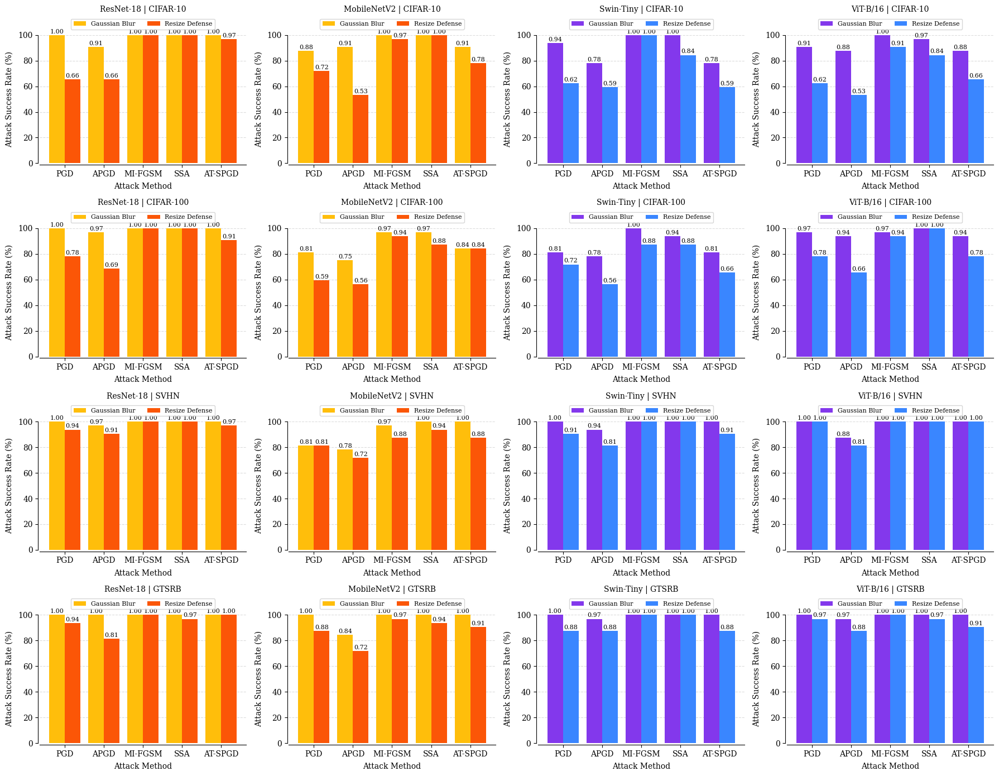

,model_group,dataset,model,attack,blur_asr,resize_asr
0,CNN,cifar10,mobilenet_v2,APGD,90.625,53.125
1,CNN,cifar10,mobilenet_v2,AT-SPGD (Ours),90.625,78.125
2,CNN,cifar10,mobilenet_v2,MIFGSM,100.000,96.875
3,CNN,cifar10,mobilenet_v2,PGD,87.500,71.875
4,CNN,cifar10,mobilenet_v2,SSA,100.000,100.000
...,...,...,...,...,...,...
75,Transformer,svhn,vit_base_patch16_224,APGD,87.500,81.250
76,Transformer,svhn,vit_base_patch16_224,AT-SPGD (Ours),100.000,100.000
77,Transformer,svhn,vit_base_patch16_224,MIFGSM,100.000,100.000
78,Transformer,svhn,vit_base_patch16_224,PGD,100.000,100.000


In [12]:
GAUSSIAN_DATASETS = GAUSSIAN_BLUR_CONFIG["datasets"]
GAUSSIAN_MODEL_GROUPS = GAUSSIAN_BLUR_CONFIG["model_groups"]
GAUSSIAN_ATTACK_ORDER = GAUSSIAN_BLUR_CONFIG["attack_order"]
GAUSSIAN_SAMPLES = int(GAUSSIAN_BLUR_CONFIG["num_samples"])
GAUSSIAN_KERNEL_SIZE = int(GAUSSIAN_BLUR_CONFIG["blur_kernel_size"])
GAUSSIAN_SIGMA = float(GAUSSIAN_BLUR_CONFIG["blur_sigma"])
RESIZE_SCALE = float(GAUSSIAN_BLUR_CONFIG["resize_scale"])
GAUSSIAN_OUTPUT_CSV = CSV_DIR / "03_blur_resize_defense_metrics.csv"

if GAUSSIAN_KERNEL_SIZE % 2 == 0:
    raise ValueError("GAUSSIAN_BLUR_CONFIG['blur_kernel_size'] must be an odd integer.")
if not 0.0 < RESIZE_SCALE <= 1.0:
    raise ValueError("GAUSSIAN_BLUR_CONFIG['resize_scale'] must be in the interval (0, 1].")


def resolve_attack_tensor_key(artifact: dict, attack_name: str) -> str:
    attack_keys = {
        "AT-SPGD (Ours)": ("adv_AT-SPGD", "adv_ATSPGD", "adv_Adaptive"),
        "AT-SPGD": ("adv_AT-SPGD", "adv_ATSPGD", "adv_Adaptive"),
    }.get(attack_name, (f"adv_{attack_name}",))
    return next(key for key in attack_keys if key in artifact)


def apply_gaussian_blur(images: torch.Tensor) -> torch.Tensor:
    return TF.gaussian_blur(
        images,
        kernel_size=[GAUSSIAN_KERNEL_SIZE, GAUSSIAN_KERNEL_SIZE],
        sigma=[GAUSSIAN_SIGMA, GAUSSIAN_SIGMA],
    )


def apply_resize_defense(images: torch.Tensor) -> torch.Tensor:
    height, width = images.shape[-2:]
    resized_height = max(1, int(round(height * RESIZE_SCALE)))
    resized_width = max(1, int(round(width * RESIZE_SCALE)))
    downsampled = TF.resize(
        images,
        size=[resized_height, resized_width],
        interpolation=TF.InterpolationMode.BILINEAR,
        antialias=True,
    )
    return TF.resize(
        downsampled,
        size=[height, width],
        interpolation=TF.InterpolationMode.BILINEAR,
        antialias=True,
    )


def compute_blur_resize_rows() -> pd.DataFrame:
    rows = []
    for model_group, model_names in GAUSSIAN_MODEL_GROUPS.items():
        for dataset_name in GAUSSIAN_DATASETS:
            for model_name in model_names:
                model = build_vfl_model(dataset_name, model_name)
                artifact = load_saved_artifacts(dataset_name, model_name, num_samples=GAUSSIAN_SAMPLES)
                labels = artifact["labels"].to(device)

                for attack_name in GAUSSIAN_ATTACK_ORDER:
                    adversarial = artifact[resolve_attack_tensor_key(artifact, attack_name)].to(device)
                    blurred = apply_gaussian_blur(adversarial)
                    resized = apply_resize_defense(adversarial)
                    with torch.no_grad():
                        blur_logits = model(blurred)
                        resize_logits = model(resized)
                        blur_asr = (blur_logits.argmax(dim=1) != labels).float().mean().item() * 100.0
                        resize_asr = (resize_logits.argmax(dim=1) != labels).float().mean().item() * 100.0
                    rows.append(
                        {
                            "model_group": model_group,
                            "dataset": dataset_name,
                            "model": model_name,
                            "attack": attack_name,
                            "blur_asr": blur_asr,
                            "resize_asr": resize_asr,
                        }
                    )
                    del adversarial, blurred, resized, blur_logits, resize_logits

                del model, artifact, labels
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

    return pd.DataFrame(rows)


def summarize_defense_metrics(metrics_df: pd.DataFrame) -> dict[str, dict[str, object]]:
    panel_metrics: dict[str, dict[str, object]] = {}
    model_labels = RADIAL_ENERGY_CONFIG["model_labels"]
    dataset_labels = RADIAL_ENERGY_CONFIG["dataset_labels"]
    model_sequence = GAUSSIAN_BLUR_CONFIG["model_sequence"]
    group_lookup = {
        model_name: ("cnn" if model_name in set(GAUSSIAN_MODEL_GROUPS["CNN"]) else "transformer")
        for model_name in model_sequence
    }
    for dataset_name in GAUSSIAN_DATASETS:
        for model_name in model_sequence:
            group_key = group_lookup[model_name]
            model_group = "CNN" if group_key == "cnn" else "Transformer"
            panel_df = metrics_df[
                (metrics_df["model_group"] == model_group)
                & (metrics_df["dataset"] == dataset_name)
                & (metrics_df["model"] == model_name)
            ]
            attack_metrics = {}
            for attack_name in GAUSSIAN_ATTACK_ORDER:
                attack_df = panel_df[panel_df["attack"] == attack_name]
                attack_metrics[attack_name] = {
                    "blur_asr": float(attack_df["blur_asr"].mean()),
                    "resize_asr": float(attack_df["resize_asr"].mean()),
                }
            panel_title = f"{model_labels.get(model_name, model_name)} | {dataset_labels.get(dataset_name, dataset_name.upper())}"
            panel_metrics[panel_title] = {
                "group": group_key,
                "attack_metrics": attack_metrics,
            }
    return panel_metrics


defense_df = compute_blur_resize_rows()
defense_df = defense_df.sort_values(["model_group", "dataset", "model", "attack"]).reset_index(drop=True)
defense_df.to_csv(GAUSSIAN_OUTPUT_CSV, index=False)

defense_panel_metrics = summarize_defense_metrics(defense_df)

fig_gaussian = plot_gaussian_blur_comparison(defense_panel_metrics)
export_page(fig_gaussian)
display_preview(fig_gaussian, GAUSSIAN_BLUR_CONFIG)
plt.close(fig_gaussian)
display(defense_df)
pdf_export.close()